# Ungraded Lab: Cats vs. Dogs Class Activation Maps

You will again practice with CAMs in this lab and this time there will only be two classes: Cats and Dogs. You will be revisiting this exercise in this week's programming assignment so it's best if you become familiar with the steps discussed here, particularly in preprocessing the image and building the model.

## Imports

In [11]:
import tensorflow_datasets as tfds
import tensorflow as tf

import keras
from keras.models import Sequential,Model
from keras.layers import Dense,Conv2D,Flatten,MaxPooling2D,GlobalAveragePooling2D

import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
import cv2

## Download and Prepare the Dataset

We will use the [Cats vs Dogs](https://www.tensorflow.org/datasets/catalog/cats_vs_dogs) dataset and we can load it via Tensorflow Datasets. The images are labeled 0 for cats and 1 for dogs.

In [12]:
train_data = tfds.load('cats_vs_dogs', split='train[:80%]', as_supervised=True)
validation_data = tfds.load('cats_vs_dogs', split='train[80%:90%]', as_supervised=True)
test_data = tfds.load('cats_vs_dogs', split='train[-10%:]', as_supervised=True)

The cell below will preprocess the images and create batches before feeding it to our model.

In [13]:
def augment_images(image, label):

  # cast to float
  image = tf.cast(image, tf.float32)
  # normalize the pixel values
  image = (image/255)
  # resize to 300 x 300
  image = tf.image.resize(image,(300,300))

  return image, label

# use the utility function above to preprocess the images
augmented_training_data = train_data.map(augment_images)

# shuffle and create batches before training
train_batches = augmented_training_data.shuffle(1024).batch(32)

## Build the classifier

This will look familiar to you because it is almost identical to the previous model we built. The key difference is the output is just one unit that is sigmoid activated. This is because we're only dealing with two classes.

In [14]:
model = Sequential()
model.add(Conv2D(16,input_shape=(300,300,3),kernel_size=(3,3),activation='relu',padding='same'))
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Conv2D(32,kernel_size=(3,3),activation='relu',padding='same'))
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Conv2D(64,kernel_size=(3,3),activation='relu',padding='same'))
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Conv2D(128,kernel_size=(3,3),activation='relu',padding='same'))
model.add(GlobalAveragePooling2D())
model.add(Dense(1,activation='sigmoid'))

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 300, 300, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 150, 150, 16)     0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 150, 150, 32)      4640      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 75, 75, 32)       0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 75, 75, 64)        18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 37, 37, 64)      

The loss can be adjusted from last time to deal with just two classes. For that, we pick `binary_crossentropy`.

In [15]:
# Training will take around 30 minutes to complete using a GPU. Time for a break!

model.compile(loss='binary_crossentropy',metrics=['accuracy'],optimizer=tf.keras.optimizers.RMSprop(lr=0.001))
model.fit(train_batches,epochs=25)

582/582 [==============================] - 11s 19ms/step - loss: 0.5290 - accuracy: 0.7396
Epoch 12/25
582/582 [==============================] - 12s 19ms/step - loss: 0.5239 - accuracy: 0.7434
Epoch 13/25
582/582 [==============================] - 12s 19ms/step - loss: 0.5182 - accuracy: 0.7502
Epoch 14/25
582/582 [==============================] - 12s 19ms/step - loss: 0.5093 - accuracy: 0.7545
Epoch 15/25
582/582 [==============================] - 11s 19ms/step - loss: 0.5016 - accuracy: 0.7596
Epoch 16/25
582/582 [==============================] - 12s 19ms/step - loss: 0.4917 - accuracy: 0.7701
Epoch 17/25
582/582 [==============================] - 12s 19ms/step - loss: 0.4869 - accuracy: 0.7690
Epoch 18/25
582/582 [==============================] - 11s 19ms/step - loss: 0.4779 - accuracy: 0.7783
Epoch 19/25
582/582 [==============================] - 12s 19ms/step - loss: 0.4710 - accuracy: 0.7817
Epoch 20/25
582/582 [==============================] - 12s 19ms/step - loss: 0.4626 -

Epoch 1/25
582/582 [==============================] - 13s 19ms/step - loss: 0.6652 - accuracy: 0.5801
Epoch 2/25
582/582 [==============================] - 11s 19ms/step - loss: 0.6353 - accuracy: 0.6199
Epoch 3/25
582/582 [==============================] - 12s 19ms/step - loss: 0.6203 - accuracy: 0.6534
Epoch 4/25
582/582 [==============================] - 11s 19ms/step - loss: 0.6015 - accuracy: 0.6735
Epoch 5/25
582/582 [==============================] - 11s 19ms/step - loss: 0.5881 - accuracy: 0.6856
Epoch 6/25
582/582 [==============================] - 12s 19ms/step - loss: 0.5712 - accuracy: 0.7057
Epoch 7/25
582/582 [==============================] - 12s 19ms/step - loss: 0.5602 - accuracy: 0.7127
Epoch 8/25
582/582 [==============================] - 11s 19ms/step - loss: 0.5486 - accuracy: 0.7265
Epoch 9/25
582/582 [==============================] - 12s 19ms/step - loss: 0.5386 - accuracy: 0.7314
Epoch 10/25
582/582 [==============================] - 11s 19ms/step - loss: 0.529

## Building the CAM model

You will follow the same steps as before in generating the class activation maps.

In [16]:
gap_weights = model.layers[-1].get_weights()[0]
gap_weights.shape

cam_model  = Model(inputs=model.input,outputs=(model.layers[-3].output,model.layers[-1].output))
cam_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_input (InputLayer)   [(None, 300, 300, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 300, 300, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 150, 150, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 150, 150, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 75, 75, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 75, 75, 64)        18496 

In [17]:
def show_cam(image_value, features, results):
  '''
  Displays the class activation map of an image

  Args:
    image_value (tensor) -- preprocessed input image with size 300 x 300
    features (array) -- features of the image, shape (1, 37, 37, 128)
    results (array) -- output of the sigmoid layer
  '''

  # there is only one image in the batch so we index at `0`
  features_for_img = features[0]
  prediction = results[0]

  # there is only one unit in the output so we get the weights connected to it
  class_activation_weights = gap_weights[:,0]

  # upsample to the image size
  class_activation_features = sp.ndimage.zoom(features_for_img, (300/37, 300/37, 1), order=2)

  # compute the intensity of each feature in the CAM
  cam_output  = np.dot(class_activation_features,class_activation_weights)

  # visualize the results
  print(f'sigmoid output: {results}')
  print(f"prediction: {'dog' if round(results[0][0]) else 'cat'}")
  plt.figure(figsize=(8,8))
  plt.imshow(cam_output, cmap='jet', alpha=0.5)
  plt.imshow(tf.squeeze(image_value), alpha=0.5)
  plt.show()


## Testing the Model

Let's download a few images and see how the class activation maps look like.

In [18]:
!wget -O cat1.jpg https://storage.googleapis.com/tensorflow-1-public/tensorflow-3-temp/MLColabImages/cat1.jpeg
!wget -O cat2.jpg https://storage.googleapis.com/tensorflow-1-public/tensorflow-3-temp/MLColabImages/cat2.jpeg
!wget -O catanddog.jpg https://storage.googleapis.com/tensorflow-1-public/tensorflow-3-temp/MLColabImages/catanddog.jpeg
!wget -O dog1.jpg https://storage.googleapis.com/tensorflow-1-public/tensorflow-3-temp/MLColabImages/dog1.jpeg
!wget -O dog2.jpg https://storage.googleapis.com/tensorflow-1-public/tensorflow-3-temp/MLColabImages/dog2.jpeg

--2023-06-22 15:30:51--  https://storage.googleapis.com/tensorflow-1-public/tensorflow-3-temp/MLColabImages/cat1.jpeg
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.68.128, 64.233.170.128, 172.253.118.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.68.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 414826 (405K) [image/jpeg]
Saving to: ‘cat1.jpg’

cat1.jpg            100%[===================>] 405.10K   576KB/s    in 0.7s    

2023-06-22 15:30:52 (576 KB/s) - ‘cat1.jpg’ saved [414826/414826]

--2023-06-22 15:30:52--  https://storage.googleapis.com/tensorflow-1-public/tensorflow-3-temp/MLColabImages/cat2.jpeg
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.68.128, 64.233.170.128, 172.253.118.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.68.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 599639 (586K) [image/jpeg]
Saving to: ‘c

1/1 [==============================] - 0s 235ms/step
sigmoid output: [[0.18655781]]
prediction: cat


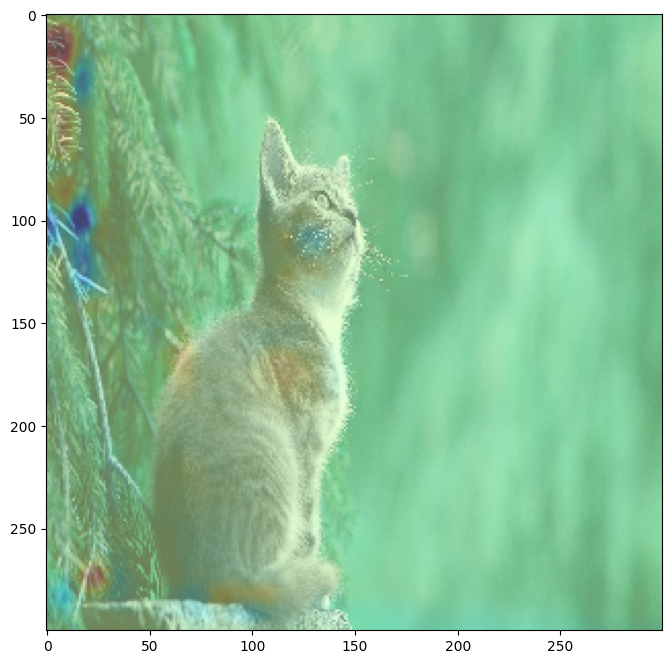

1/1 [==============================] - 0s 21ms/step
sigmoid output: [[0.39913124]]
prediction: cat


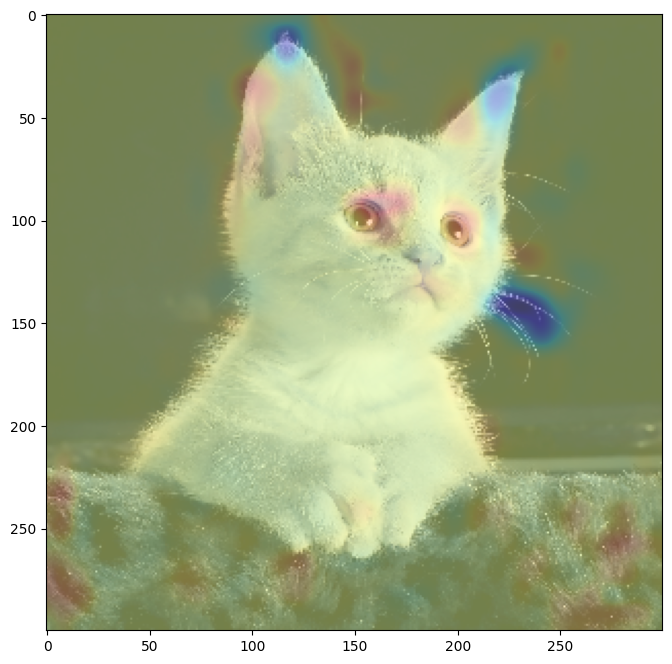

1/1 [==============================] - 0s 21ms/step
sigmoid output: [[0.5698467]]
prediction: dog


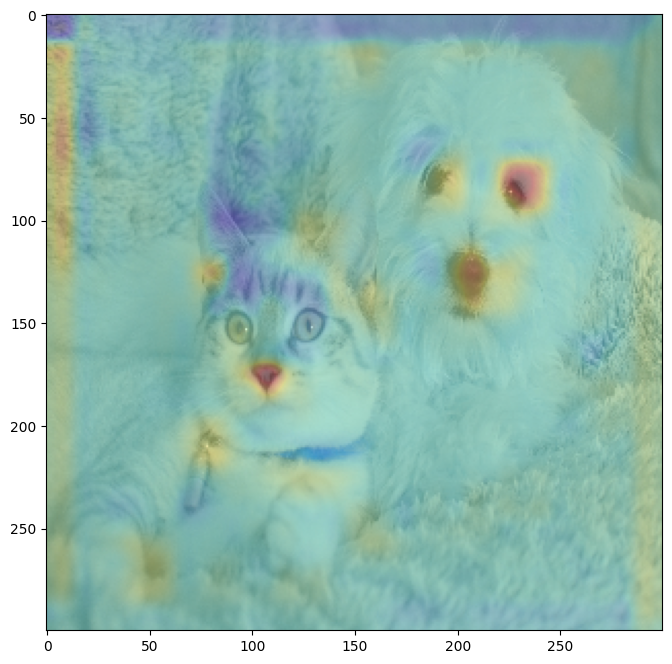

1/1 [==============================] - 0s 22ms/step
sigmoid output: [[0.3139459]]
prediction: cat


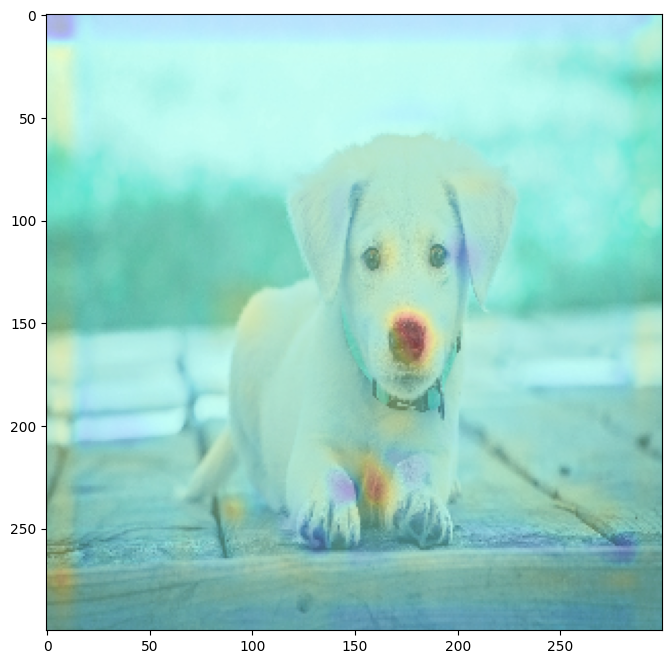

1/1 [==============================] - 0s 22ms/step
sigmoid output: [[0.6932484]]
prediction: dog


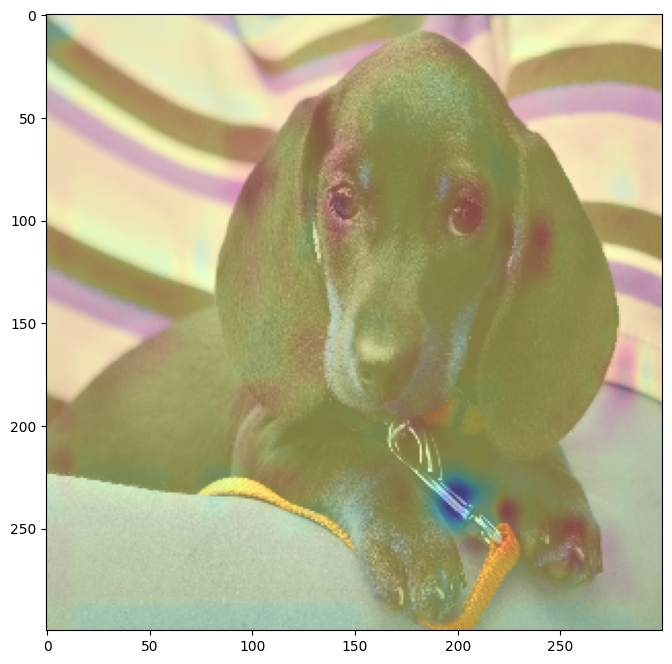

1/1 [==============================] - 0s 75ms/step
sigmoid output: [[0.10713883]]
prediction: cat


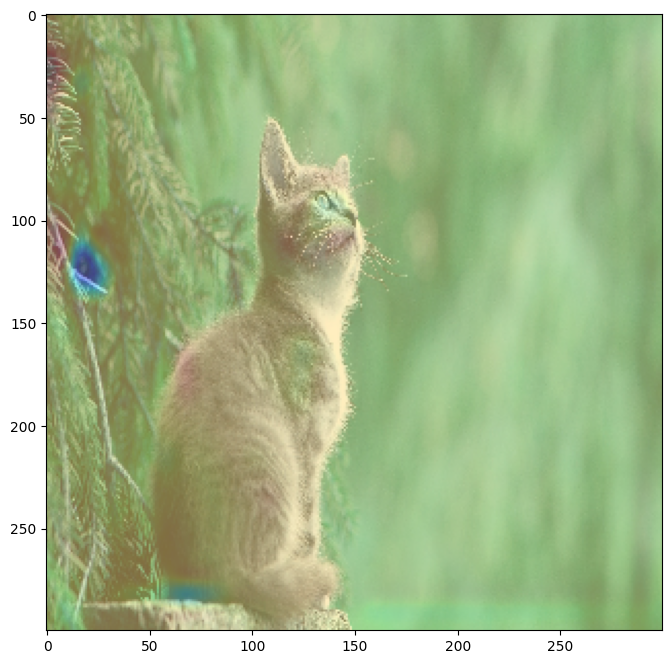

1/1 [==============================] - 0s 21ms/step
sigmoid output: [[0.69639736]]
prediction: dog


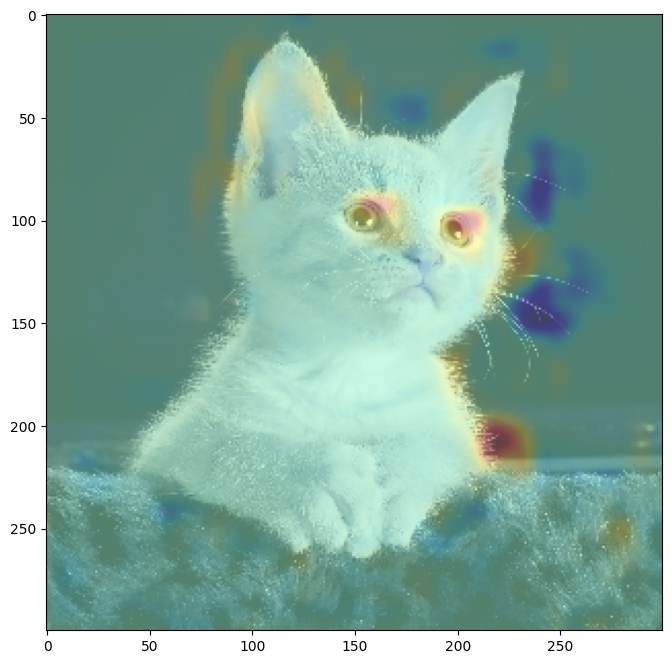

1/1 [==============================] - 0s 21ms/step
sigmoid output: [[0.82308376]]
prediction: dog


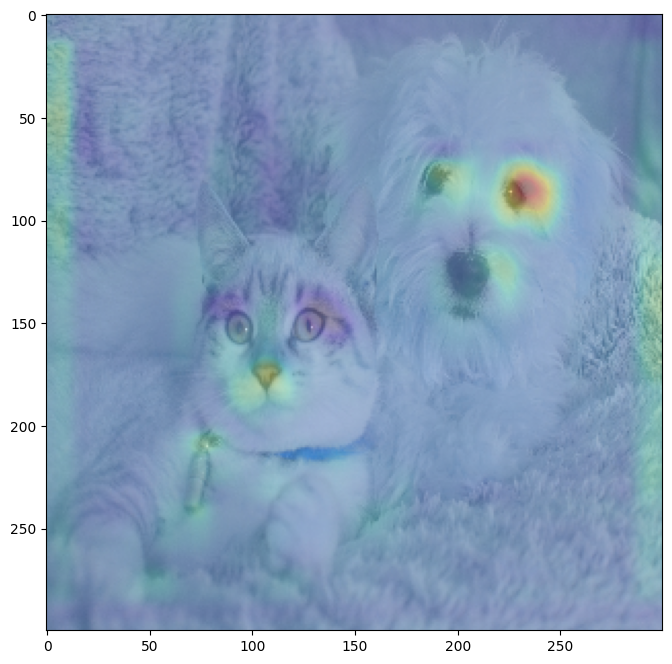

1/1 [==============================] - 0s 20ms/step
sigmoid output: [[0.5873515]]
prediction: dog


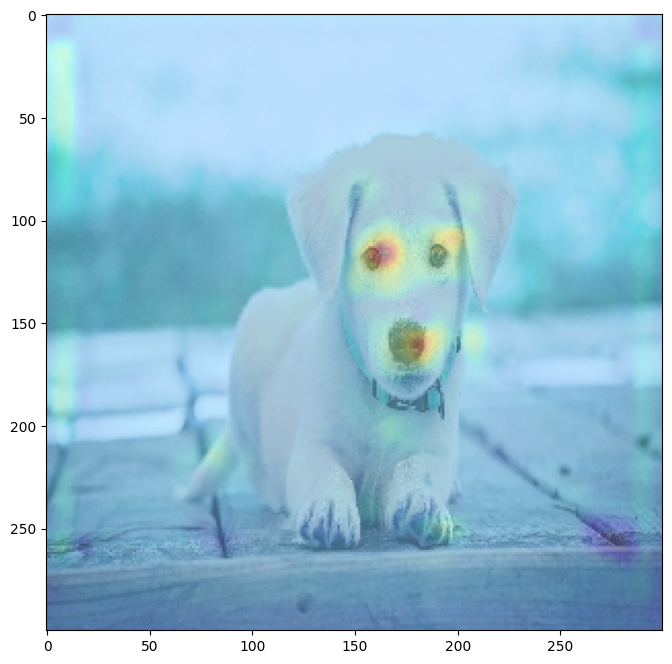

1/1 [==============================] - 0s 20ms/step
sigmoid output: [[0.59660417]]
prediction: dog


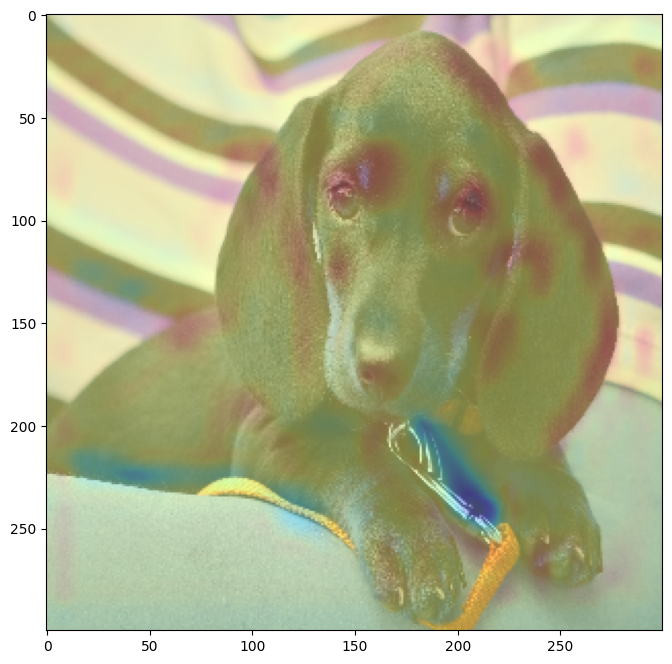

In [19]:
# utility function to preprocess an image and show the CAM
def convert_and_classify(image):

  # load the image
  img = cv2.imread(image)

  # preprocess the image before feeding it to the model
  img = cv2.resize(img, (300,300)) / 255.0

  # add a batch dimension because the model expects it
  tensor_image = np.expand_dims(img, axis=0)

  # get the features and prediction
  features,results = cam_model.predict(tensor_image)

  # generate the CAM
  show_cam(tensor_image, features, results)

convert_and_classify('cat1.jpg')
convert_and_classify('cat2.jpg')
convert_and_classify('catanddog.jpg')
convert_and_classify('dog1.jpg')
convert_and_classify('dog2.jpg')

Let's also try it with some of the test images before we make some observations.

ground truth: cat
1/1 [==============================] - 0s 21ms/step
sigmoid output: [[0.39372253]]
prediction: cat


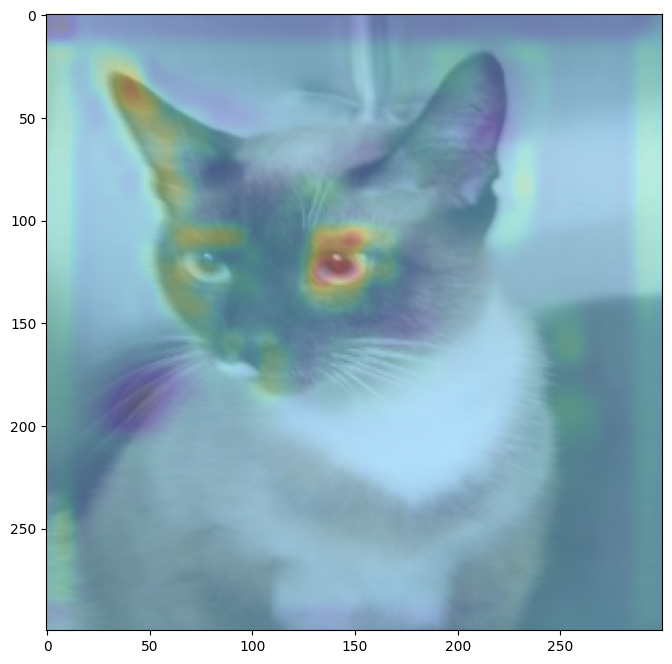

ground truth: dog
1/1 [==============================] - 0s 21ms/step
sigmoid output: [[0.37549508]]
prediction: cat


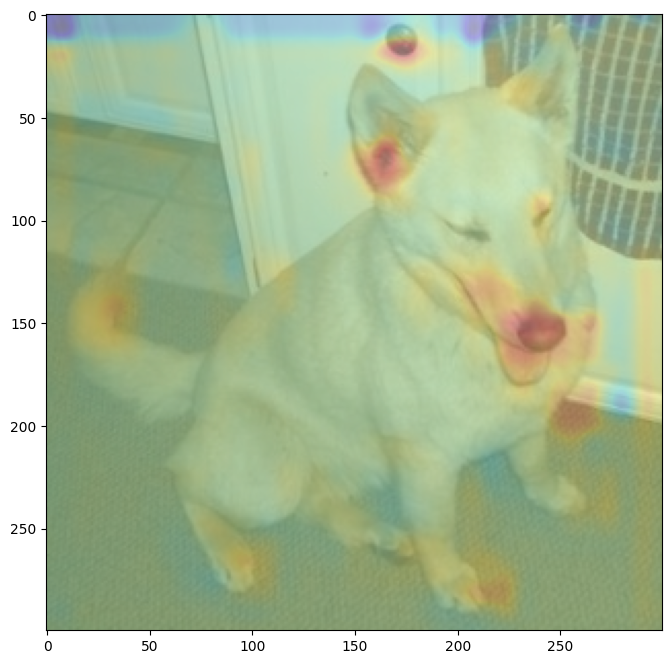

ground truth: dog
1/1 [==============================] - 0s 21ms/step
sigmoid output: [[0.36481935]]
prediction: cat


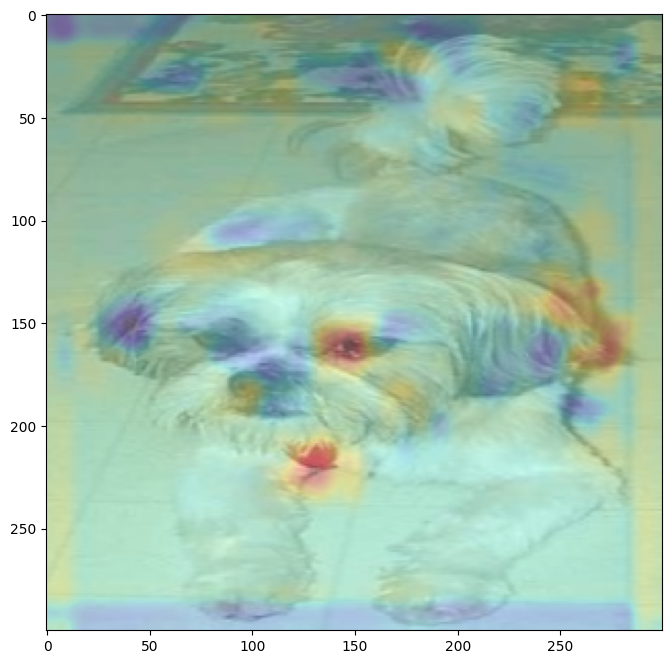

ground truth: cat
1/1 [==============================] - 0s 21ms/step
sigmoid output: [[0.03827476]]
prediction: cat


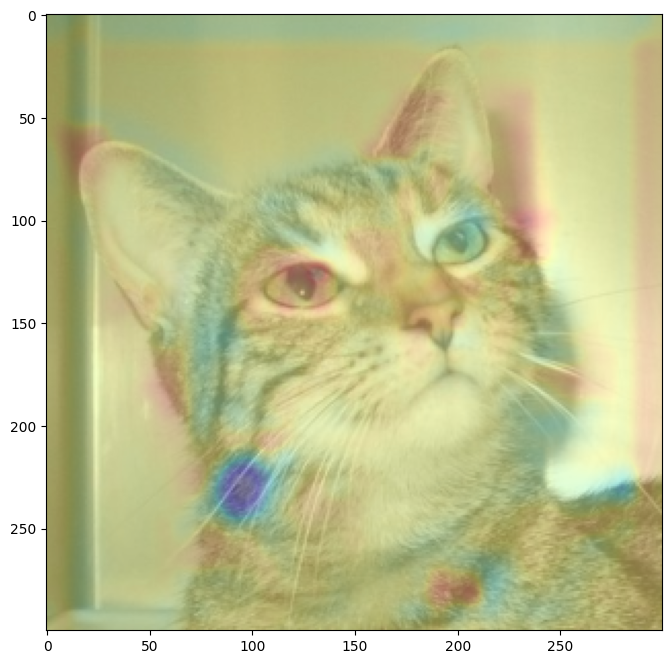

ground truth: cat
1/1 [==============================] - 0s 21ms/step
sigmoid output: [[0.3565164]]
prediction: cat


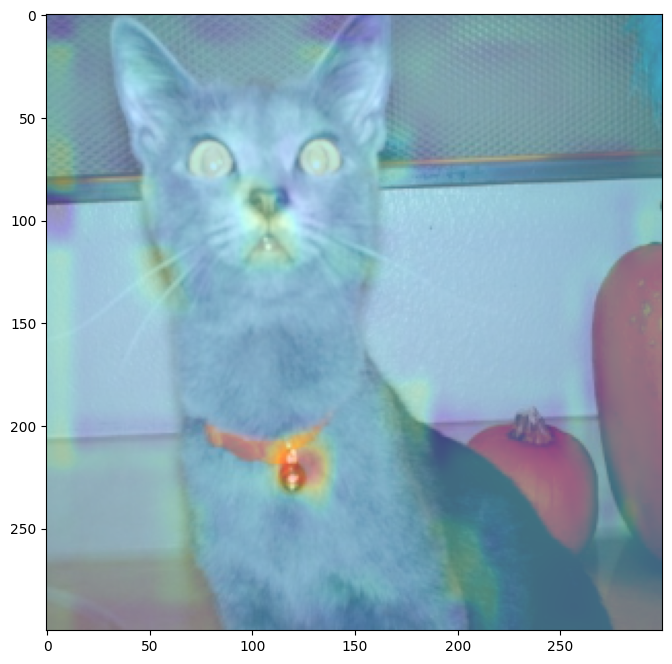

ground truth: cat
1/1 [==============================] - 0s 21ms/step
sigmoid output: [[0.61558735]]
prediction: dog


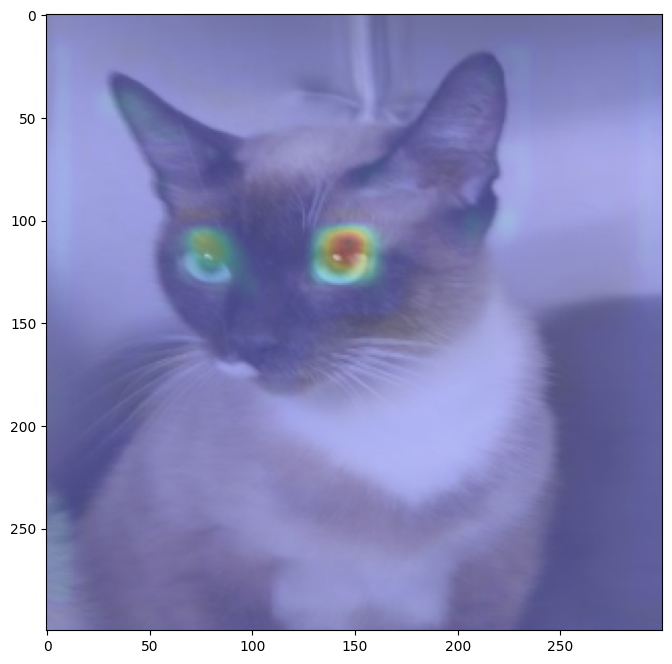

ground truth: dog
1/1 [==============================] - 0s 21ms/step
sigmoid output: [[0.56406707]]
prediction: dog


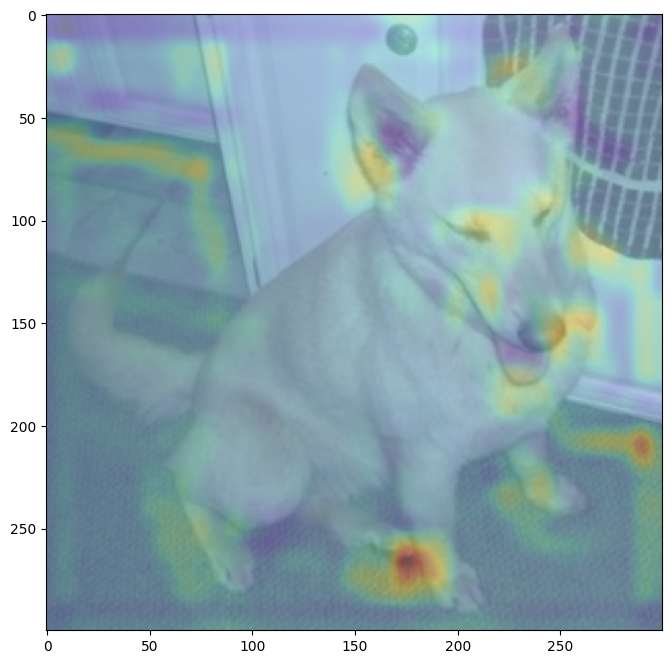

ground truth: dog
1/1 [==============================] - 0s 21ms/step
sigmoid output: [[0.42018974]]
prediction: cat


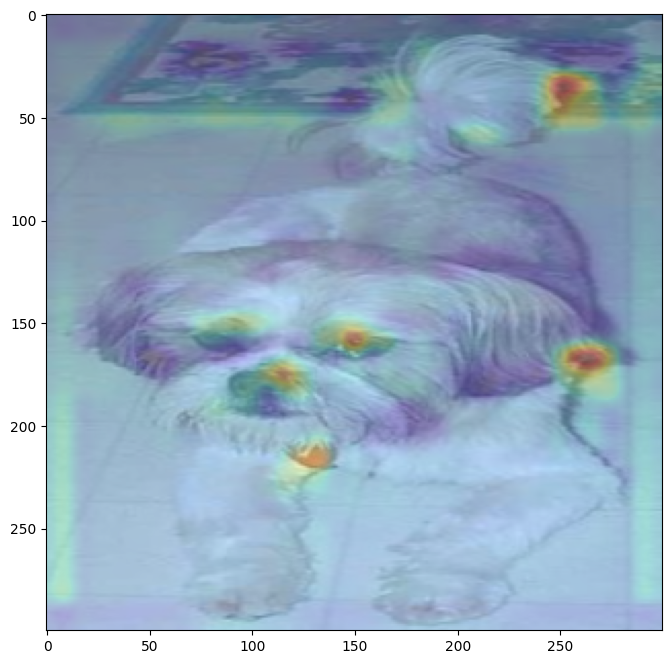

ground truth: cat
1/1 [==============================] - 0s 21ms/step
sigmoid output: [[0.03095557]]
prediction: cat


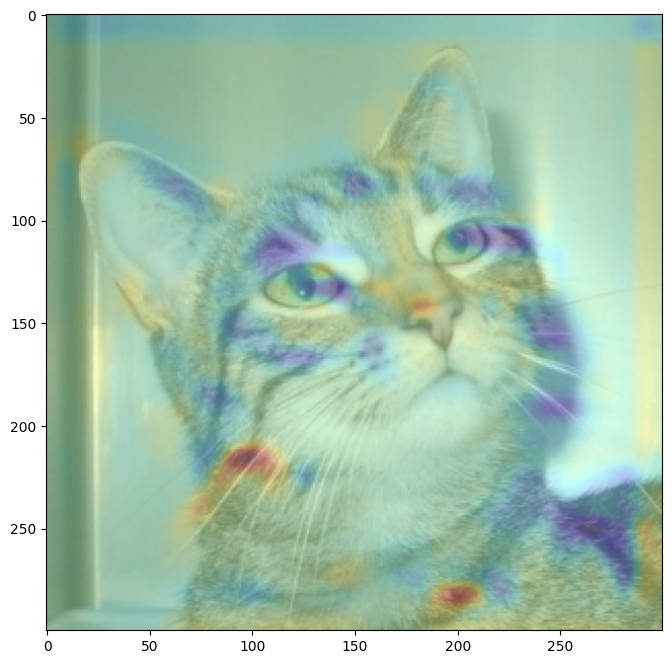

ground truth: cat
1/1 [==============================] - 0s 20ms/step
sigmoid output: [[0.3008656]]
prediction: cat


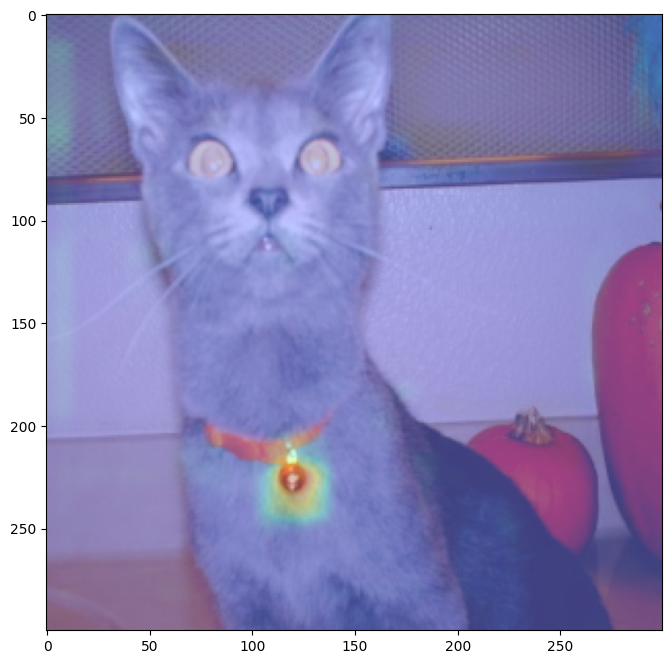

In [20]:
# preprocess the test images
augmented_test_data = test_data.map(augment_images)
test_batches = augmented_test_data.batch(1)


for img, lbl in test_batches.take(5):
  print(f"ground truth: {'dog' if lbl else 'cat'}")
  features,results = cam_model.predict(img)
  show_cam(img, features, results)

If your training reached 80% accuracy, you may notice from the images above that the presence of eyes and nose play a big part in determining a dog, while whiskers and a colar mostly point to a cat. Some can be misclassified based on the presence or absence of these features. This tells us that the model is not yet performing optimally and we need to tweak our process (e.g. add more data, train longer, use a different model, etc).